In [1]:
!pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.8 MB/s eta 0:00:00


In [2]:
import os
import sys
import torch
import importlib
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
from torch.utils.data import DataLoader
from tqdm import tqdm

# 1. Hardware Check
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Hardware: {device} ({torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'})")

# 2. Clean Clone
REPO_URL = "https://github.com/Kaankocc/autovision-cityscapes.git"
REPO_NAME = "autovision-cityscapes"
if os.path.exists(REPO_NAME):
    !rm -rf {REPO_NAME}
print(f"🚀 Cloning fresh repository...")
!git clone {REPO_URL}

# 3. Path Configuration
PROJECT_ROOT = os.path.abspath(REPO_NAME)
SRC_PATH = os.path.join(PROJECT_ROOT, "src")
if SRC_PATH not in sys.path:
    sys.path.insert(0, SRC_PATH)

# Fresh imports from your repo
from dataset import CityscapesKaggleDataset
from models.deeplab_v3 import build_deeplabv3_plus

✅ Hardware: cuda (Tesla P100-PCIE-16GB)
🚀 Cloning fresh repository...
Cloning into 'autovision-cityscapes'...
remote: Enumerating objects: 46, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 46 (delta 13), reused 41 (delta 9), pack-reused 0 (from 0)
Receiving objects: 100% (46/46), 23.74 MiB | 21.82 MiB/s, done.
Resolving deltas: 100% (13/13), done.


In [3]:
# 1. Paths (No need to bake masks anymore!)
RAW_DATA = "/kaggle/input/datasets/dansbecker/cityscapes-image-pairs/cityscapes_data"

# 2. Initialize DataLoaders
train_ds = CityscapesKaggleDataset(root_dir=RAW_DATA, target_size=(512, 512))
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True)

# 3. Initialize Phase 2 Model: DeepLabV3+
model_instance = build_deeplabv3_plus(n_classes=7).to(device)

# 4. Weighted Loss Function
class_weights = torch.tensor([1.0, 0.8, 5.0, 2.0, 1.0, 15.0, 1.0]).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

# 5. Optimizer (Using a slightly lower LR for pre-trained weights)
optimizer = torch.optim.Adam(model_instance.parameters(), lr=1e-4)

print(f"✅ Initialized DeepLabV3+ (ResNet50) on {device}")
print(f"✅ Ready for 512x512 training with batch size 16")

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

✅ Initialized DeepLabV3+ (ResNet50) on cuda
✅ Ready for 512x512 training with batch size 16


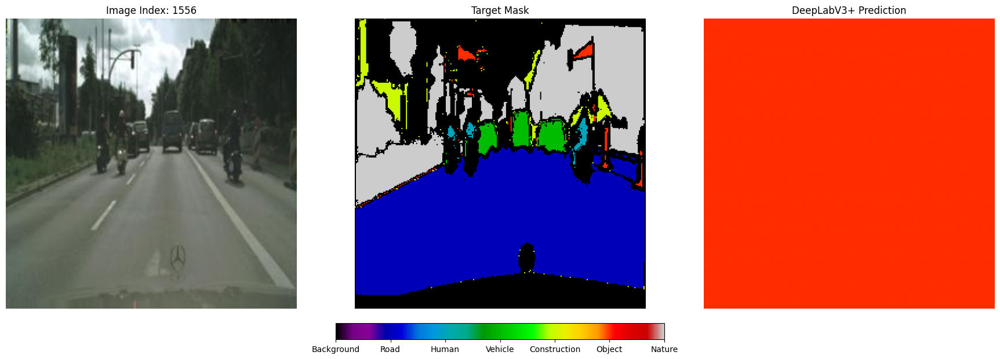

In [4]:
CATEGORIES = ["Background", "Road", "Human", "Vehicle", "Construction", "Object", "Nature"]

def denormalize(tensor):
    """Reverses ImageNet normalization for visualization."""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return tensor * std + mean

def visualize_with_labels(model, dataset, device, index=None):
    model.eval()
    if index is None:
        index = np.random.randint(0, len(dataset))
    
    image, mask = dataset[index]
    
    with torch.no_grad():
        input_tensor = image.unsqueeze(0).to(device)
        output = model(input_tensor)
        prediction = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    fig, ax = plt.subplots(1, 3, figsize=(22, 8))
    
    # 1. Original (Denormalized)
    vis_img = denormalize(image).clamp(0, 1) # Ensure valid pixel range
    ax[0].imshow(vis_img.permute(1, 2, 0).numpy())
    ax[0].set_title(f"Image Index: {index}")
    ax[0].axis('off')
    
    # 2. Ground Truth
    gt_plot = ax[1].imshow(mask, cmap='nipy_spectral', vmin=0, vmax=6)
    ax[1].set_title("Target Mask")
    ax[1].axis('off')
    
    # 3. Prediction
    pred_plot = ax[2].imshow(prediction, cmap='nipy_spectral', vmin=0, vmax=6)
    ax[2].set_title("DeepLabV3+ Prediction")
    ax[2].axis('off')

    cbar = fig.colorbar(pred_plot, ax=ax, orientation='horizontal', fraction=0.046, pad=0.04)
    cbar.set_ticks(np.arange(7))
    cbar.set_ticklabels(CATEGORIES)
    
    plt.show()

# Test visualization before training
visualize_with_labels(model_instance, train_ds, device)

📡 Starting 512x512 DeepLabV3+ training on cuda...


Epoch 1/30: 100%|██████████| 372/372 [09:16<00:00,  1.50s/it, loss=0.3739]


🏁 Epoch 1 Summary | Avg Loss: 0.6404


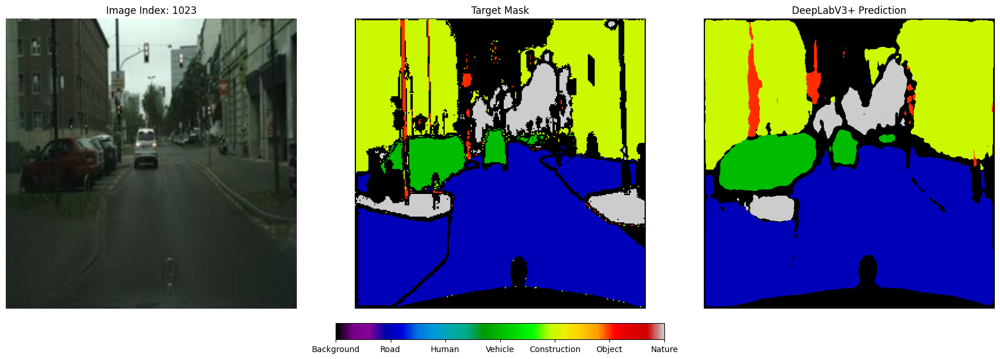

⭐ New Best Model Saved!


Epoch 2/30: 100%|██████████| 372/372 [09:07<00:00,  1.47s/it, loss=0.5643]


🏁 Epoch 2 Summary | Avg Loss: 0.4264


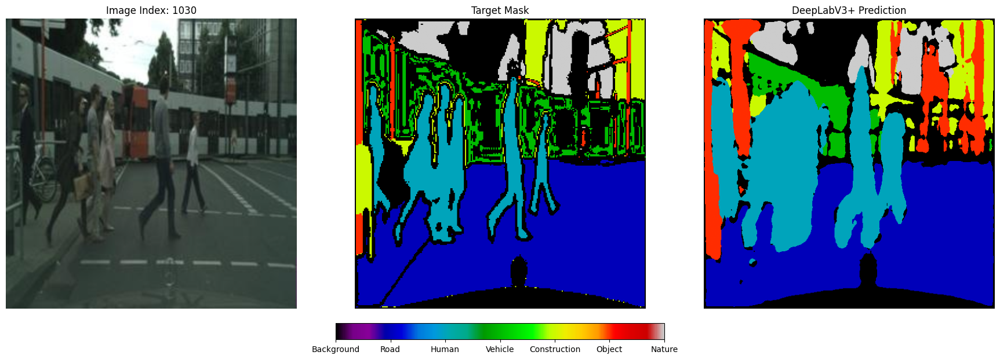

⭐ New Best Model Saved!


Epoch 3/30: 100%|██████████| 372/372 [09:07<00:00,  1.47s/it, loss=0.2947]


🏁 Epoch 3 Summary | Avg Loss: 0.3710


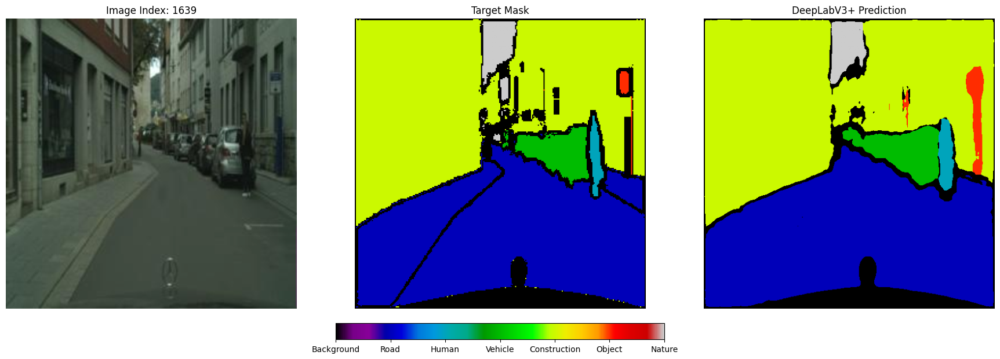

⭐ New Best Model Saved!


Epoch 4/30: 100%|██████████| 372/372 [09:06<00:00,  1.47s/it, loss=0.3160]


🏁 Epoch 4 Summary | Avg Loss: 0.3330


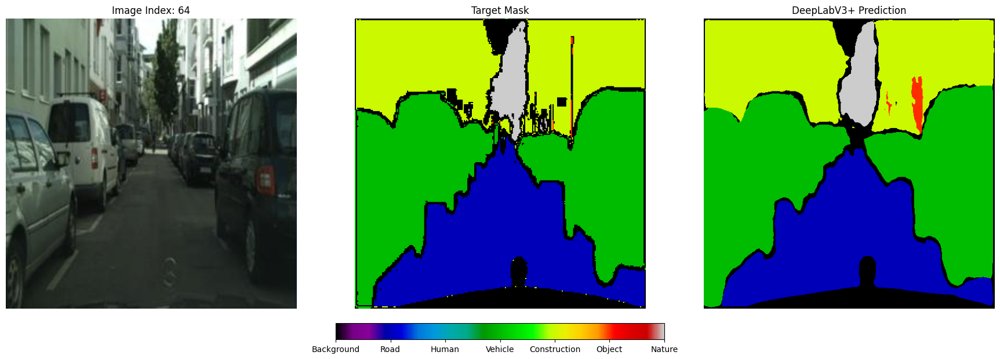

⭐ New Best Model Saved!


Epoch 5/30: 100%|██████████| 372/372 [09:04<00:00,  1.46s/it, loss=0.2797]


🏁 Epoch 5 Summary | Avg Loss: 0.3050


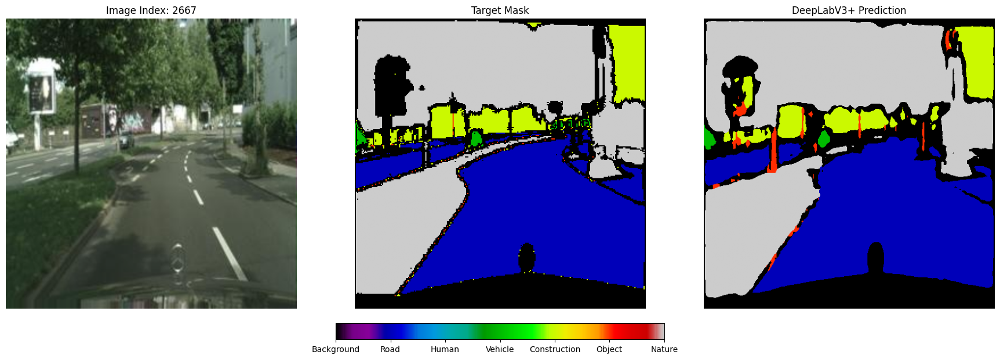

⭐ New Best Model Saved!


Epoch 6/30: 100%|██████████| 372/372 [09:15<00:00,  1.49s/it, loss=0.3163]


🏁 Epoch 6 Summary | Avg Loss: 0.2858


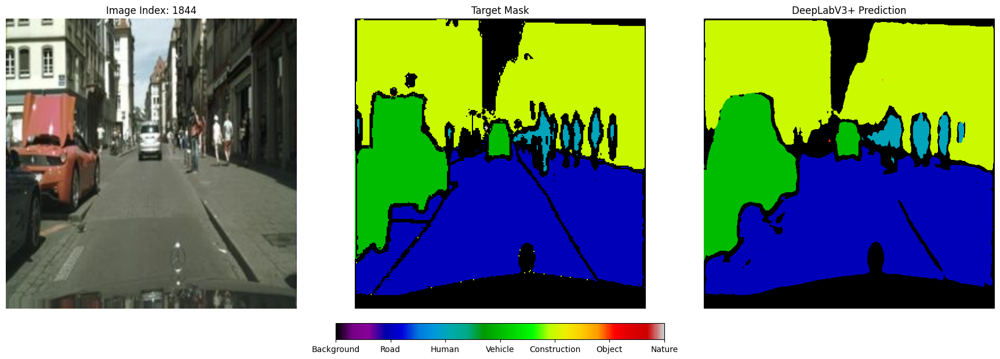

⭐ New Best Model Saved!


Epoch 7/30: 100%|██████████| 372/372 [09:10<00:00,  1.48s/it, loss=0.2857]


🏁 Epoch 7 Summary | Avg Loss: 0.2668


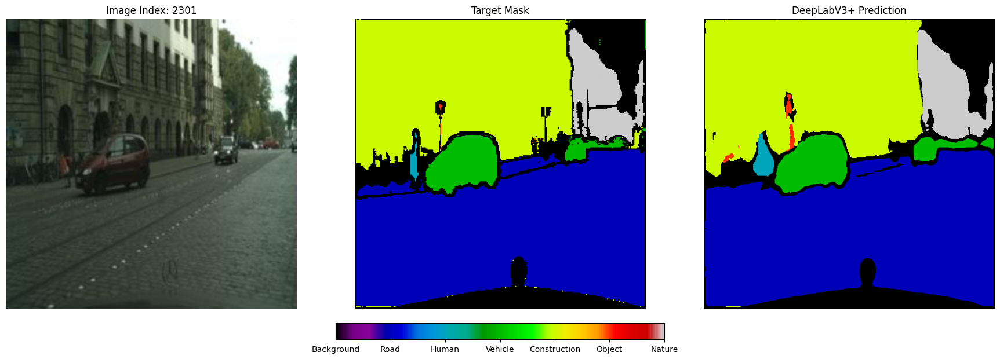

⭐ New Best Model Saved!


Epoch 8/30: 100%|██████████| 372/372 [09:09<00:00,  1.48s/it, loss=0.2315]


🏁 Epoch 8 Summary | Avg Loss: 0.2500


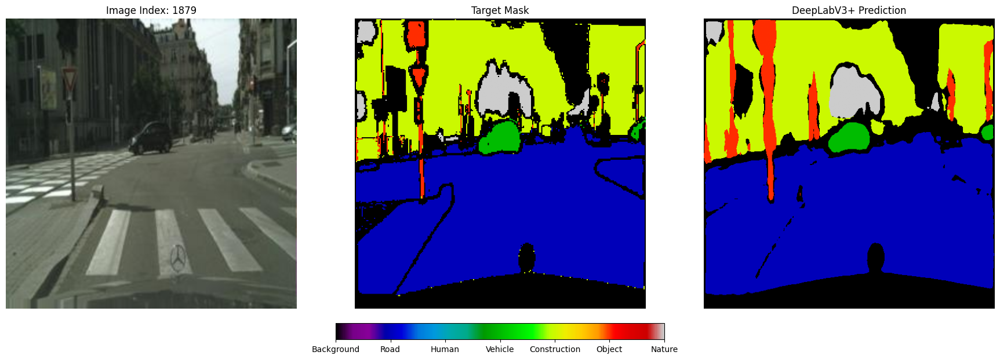

⭐ New Best Model Saved!


Epoch 9/30: 100%|██████████| 372/372 [09:06<00:00,  1.47s/it, loss=0.2044]


🏁 Epoch 9 Summary | Avg Loss: 0.2386


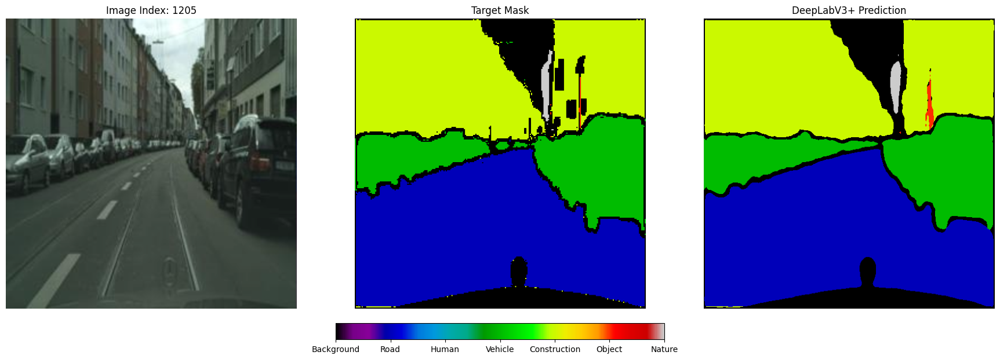

⭐ New Best Model Saved!


Epoch 10/30: 100%|██████████| 372/372 [09:06<00:00,  1.47s/it, loss=0.2584]


🏁 Epoch 10 Summary | Avg Loss: 0.2333


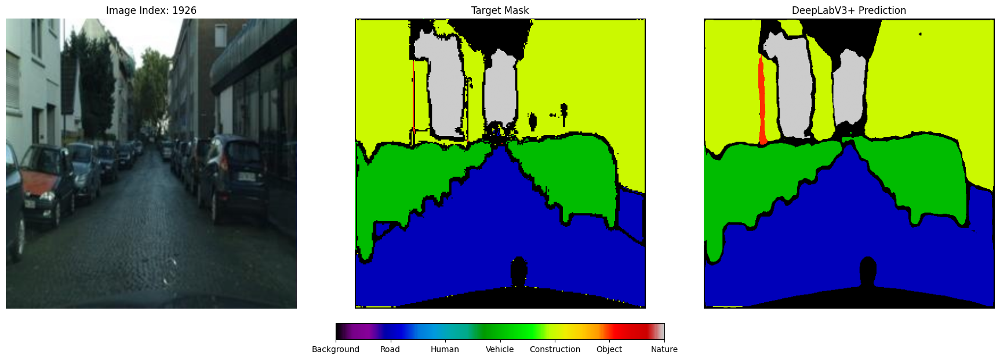

⭐ New Best Model Saved!


Epoch 11/30: 100%|██████████| 372/372 [09:03<00:00,  1.46s/it, loss=0.2265]


🏁 Epoch 11 Summary | Avg Loss: 0.2200


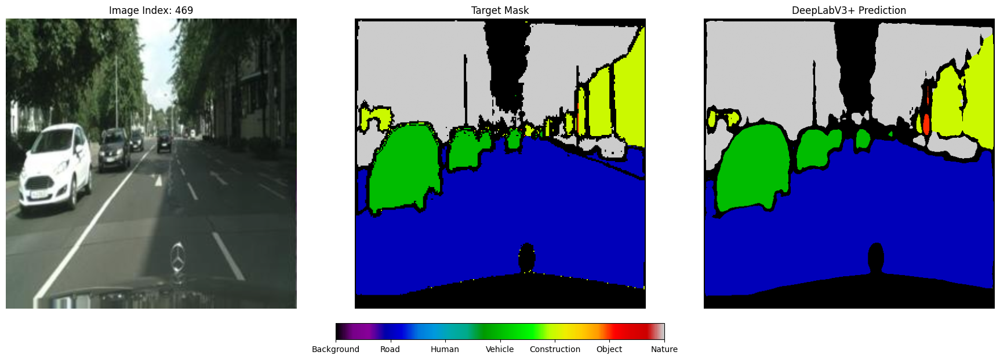

⭐ New Best Model Saved!


Epoch 12/30: 100%|██████████| 372/372 [09:08<00:00,  1.47s/it, loss=0.2106]


🏁 Epoch 12 Summary | Avg Loss: 0.2098


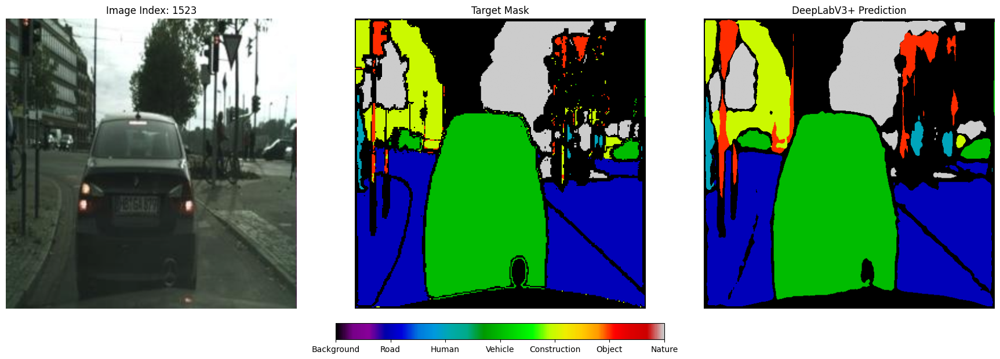

⭐ New Best Model Saved!


Epoch 13/30: 100%|██████████| 372/372 [09:07<00:00,  1.47s/it, loss=0.2059]


🏁 Epoch 13 Summary | Avg Loss: 0.2017


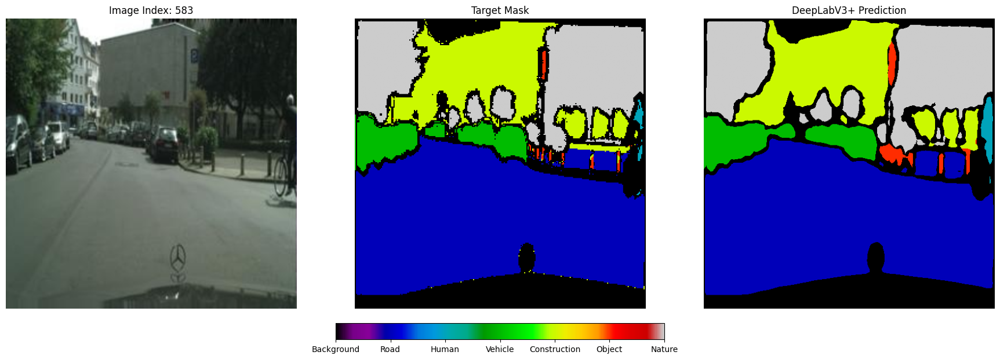

⭐ New Best Model Saved!


Epoch 14/30: 100%|██████████| 372/372 [09:05<00:00,  1.47s/it, loss=0.1745]


🏁 Epoch 14 Summary | Avg Loss: 0.1964


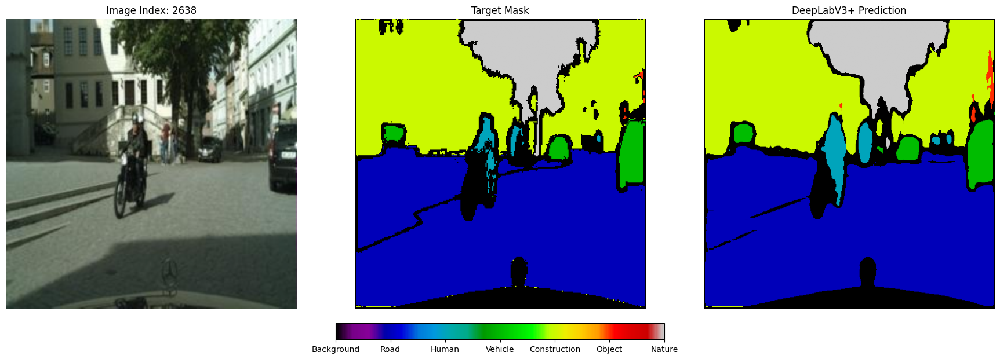

⭐ New Best Model Saved!


Epoch 15/30: 100%|██████████| 372/372 [09:07<00:00,  1.47s/it, loss=0.2192]


🏁 Epoch 15 Summary | Avg Loss: 0.2286


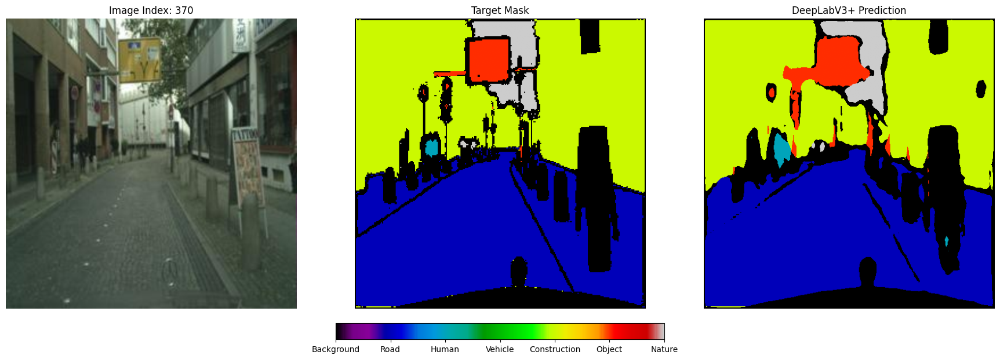

Epoch 16/30: 100%|██████████| 372/372 [09:06<00:00,  1.47s/it, loss=0.1989]


🏁 Epoch 16 Summary | Avg Loss: 0.2029


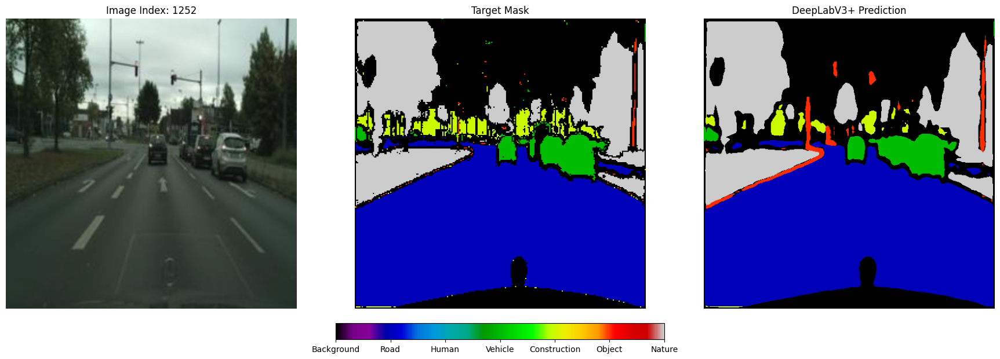

Epoch 17/30: 100%|██████████| 372/372 [09:00<00:00,  1.45s/it, loss=0.2118]


🏁 Epoch 17 Summary | Avg Loss: 0.1821


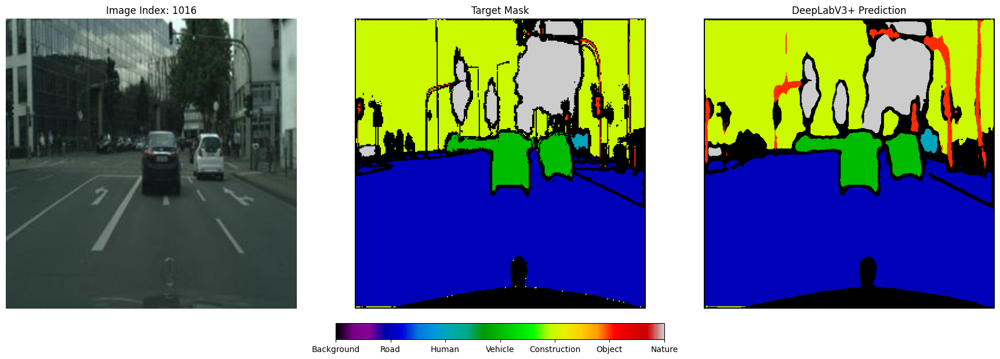

⭐ New Best Model Saved!


Epoch 18/30: 100%|██████████| 372/372 [09:04<00:00,  1.46s/it, loss=0.1648]


🏁 Epoch 18 Summary | Avg Loss: 0.1742


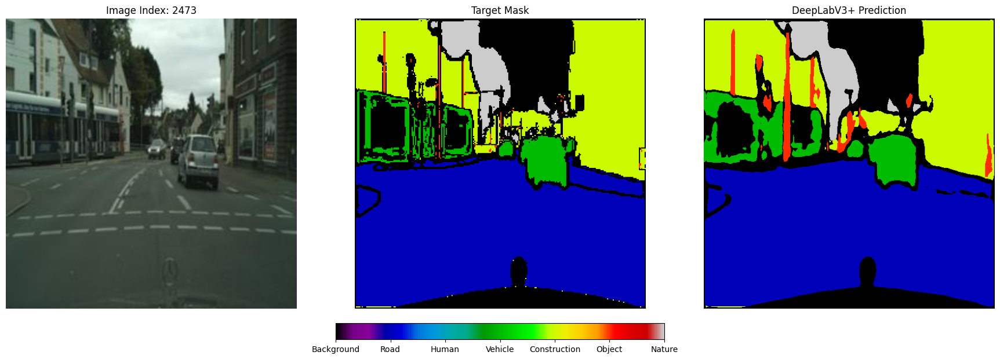

⭐ New Best Model Saved!


Epoch 19/30: 100%|██████████| 372/372 [09:11<00:00,  1.48s/it, loss=0.1837]


🏁 Epoch 19 Summary | Avg Loss: 0.1697


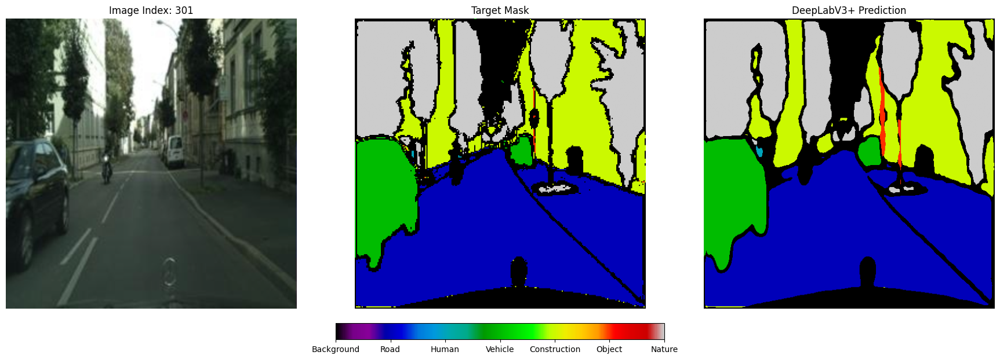

⭐ New Best Model Saved!


Epoch 20/30: 100%|██████████| 372/372 [09:09<00:00,  1.48s/it, loss=0.1742]


🏁 Epoch 20 Summary | Avg Loss: 0.1669


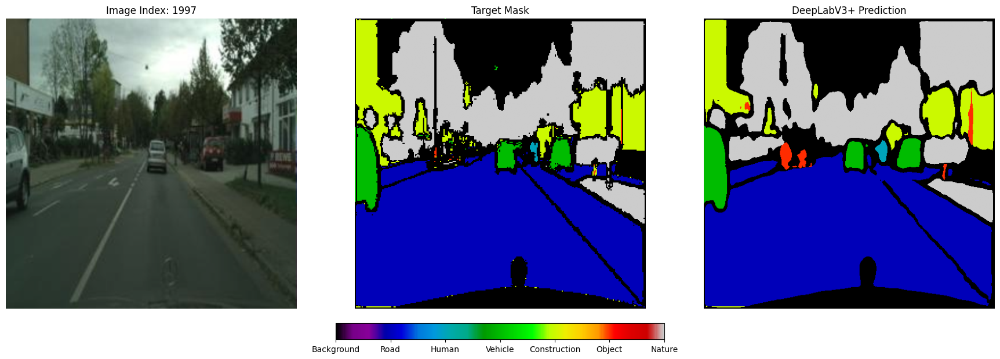

⭐ New Best Model Saved!


Epoch 21/30: 100%|██████████| 372/372 [09:14<00:00,  1.49s/it, loss=0.1625]


🏁 Epoch 21 Summary | Avg Loss: 0.1645


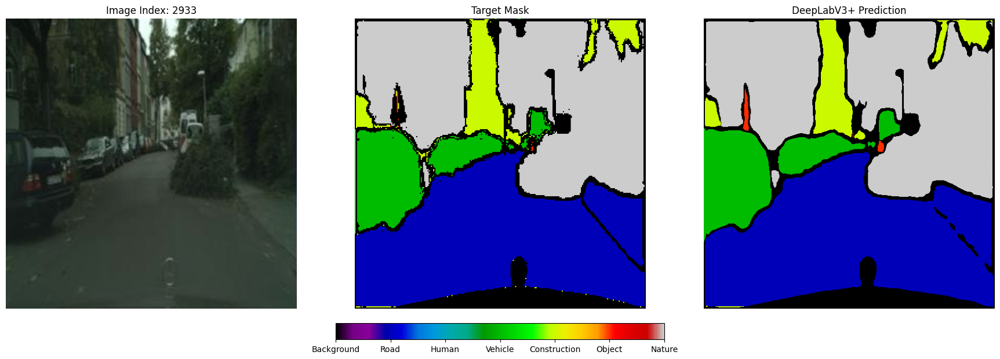

⭐ New Best Model Saved!


Epoch 22/30: 100%|██████████| 372/372 [09:20<00:00,  1.51s/it, loss=0.1754]


🏁 Epoch 22 Summary | Avg Loss: 0.1614


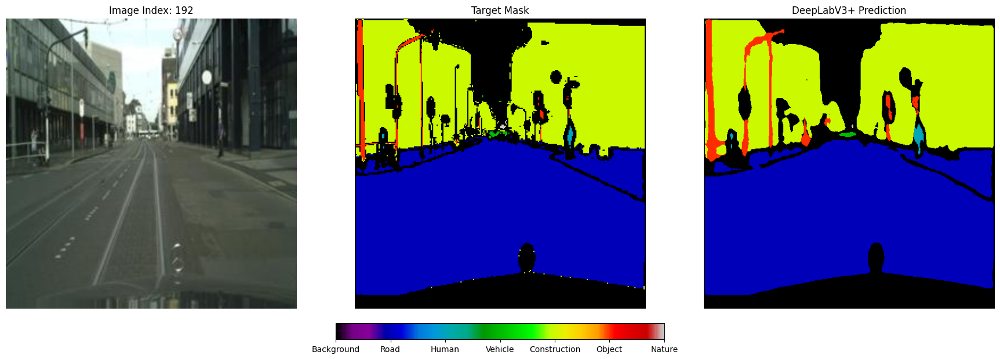

⭐ New Best Model Saved!


Epoch 23/30: 100%|██████████| 372/372 [09:23<00:00,  1.51s/it, loss=0.2144]


🏁 Epoch 23 Summary | Avg Loss: 0.1907


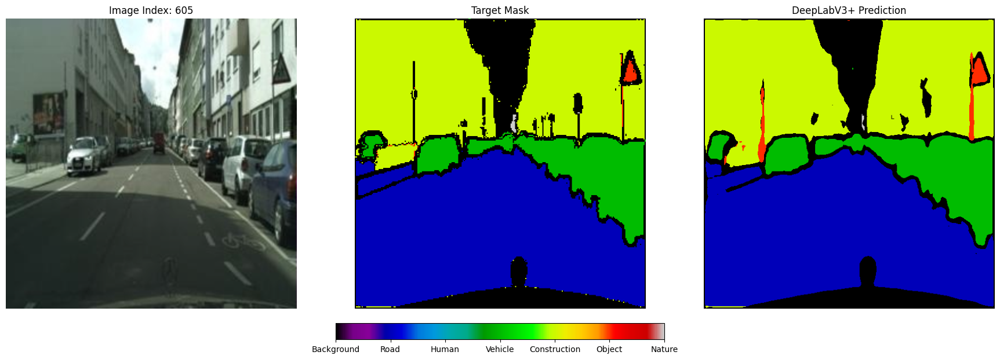

Epoch 24/30: 100%|██████████| 372/372 [09:16<00:00,  1.50s/it, loss=0.1676]


🏁 Epoch 24 Summary | Avg Loss: 0.1707


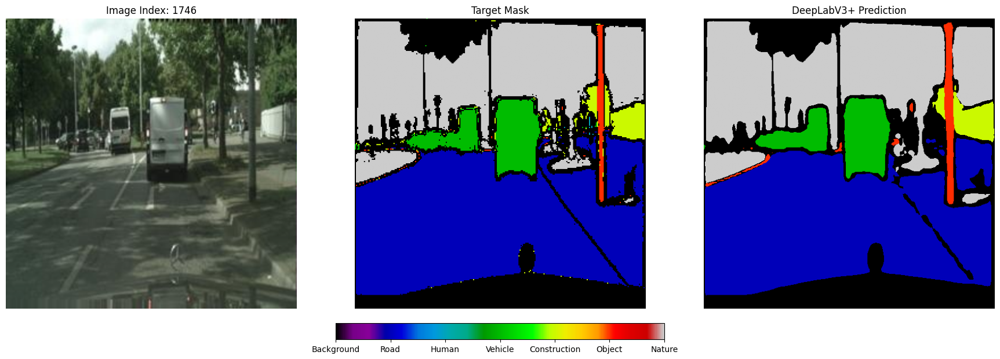

Epoch 25/30: 100%|██████████| 372/372 [09:13<00:00,  1.49s/it, loss=0.1604]


🏁 Epoch 25 Summary | Avg Loss: 0.1550


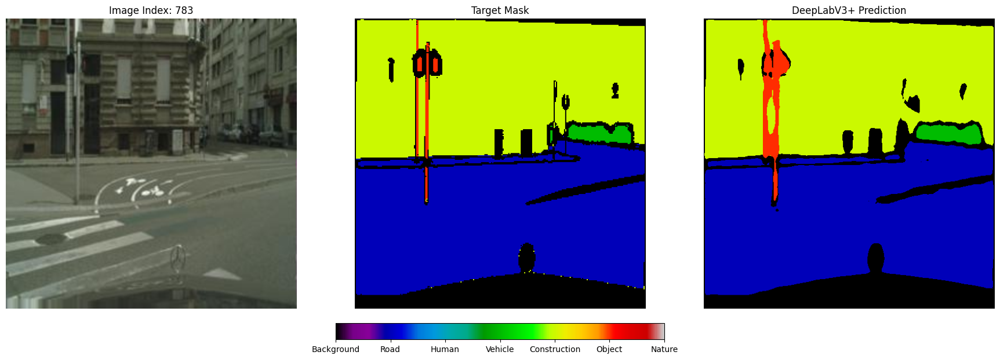

⭐ New Best Model Saved!


Epoch 26/30: 100%|██████████| 372/372 [09:07<00:00,  1.47s/it, loss=0.1486]


🏁 Epoch 26 Summary | Avg Loss: 0.1493


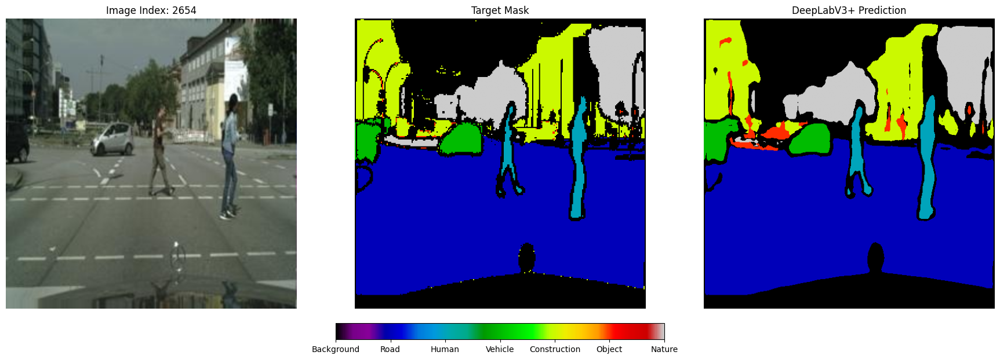

⭐ New Best Model Saved!


Epoch 27/30: 100%|██████████| 372/372 [08:59<00:00,  1.45s/it, loss=0.1278]


🏁 Epoch 27 Summary | Avg Loss: 0.1468


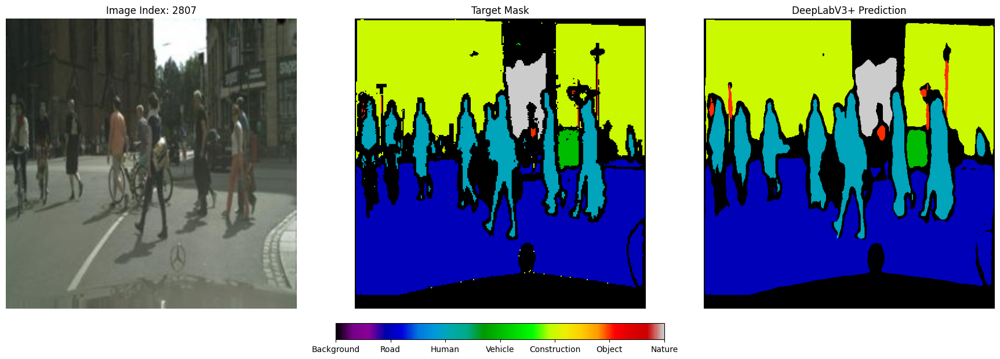

⭐ New Best Model Saved!


Epoch 28/30: 100%|██████████| 372/372 [09:10<00:00,  1.48s/it, loss=0.1244]


🏁 Epoch 28 Summary | Avg Loss: 0.1456


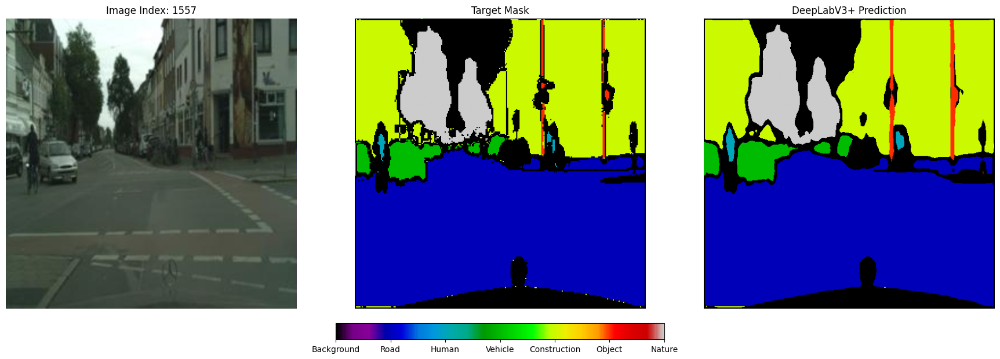

⭐ New Best Model Saved!


Epoch 29/30: 100%|██████████| 372/372 [09:07<00:00,  1.47s/it, loss=0.1506]


🏁 Epoch 29 Summary | Avg Loss: 0.1447


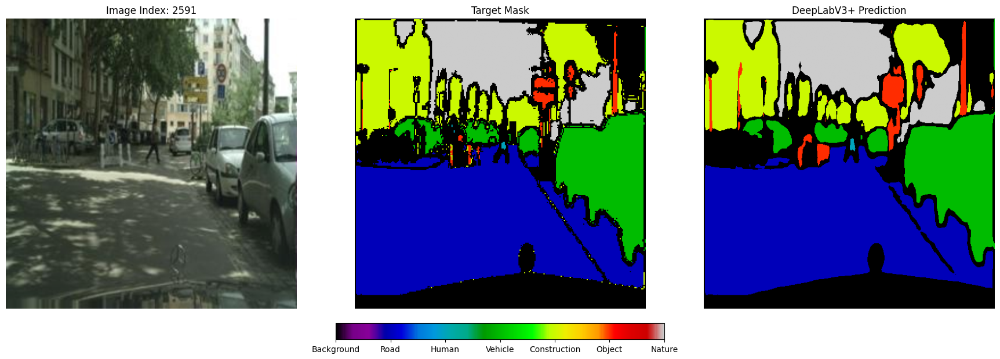

⭐ New Best Model Saved!


Epoch 30/30: 100%|██████████| 372/372 [09:07<00:00,  1.47s/it, loss=0.1417]


🏁 Epoch 30 Summary | Avg Loss: 0.1438


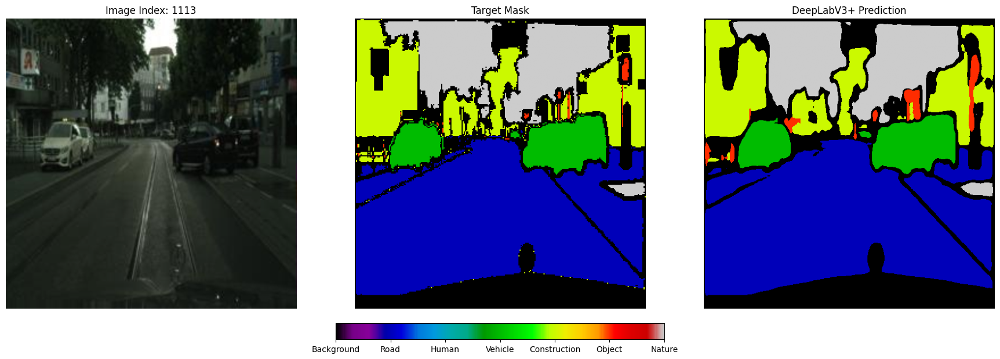

⭐ New Best Model Saved!


In [5]:
# Hyperparameters
EPOCHS = 30
best_loss = float('inf')

print(f"📡 Starting 512x512 DeepLabV3+ training on {device}...")

for epoch in range(EPOCHS):
    model_instance.train()
    running_loss = 0.0
    
    pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch+1}/{EPOCHS}")
    
    for batch_idx, (images, masks) in pbar:
        images, masks = images.to(device), masks.to(device)
        
        # 1. Forward pass
        outputs = model_instance(images)
        loss = criterion(outputs, masks)
        
        # 2. Backward pass & Optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        pbar.set_postfix({'loss': f"{loss.item():.4f}"})
    
    # --- END OF EPOCH LOGIC ---
    avg_epoch_loss = running_loss / len(train_loader)
    print(f"🏁 Epoch {epoch+1} Summary | Avg Loss: {avg_epoch_loss:.4f}")
    
    # 3. Visualize progress
    visualize_with_labels(model_instance, train_ds, device)
    
    # 4. Save the "Best" Model
    if avg_epoch_loss < best_loss:
        best_loss = avg_epoch_loss
        torch.save(model_instance.state_dict(), "deeplabv3_resnet50_best.pth")
        print(f"⭐ New Best Model Saved!")